# Object Detection fine-tuning with keras_cv

## Test
* YOLOv8
* ResNet50

## Requirements
* keras==2.14.0
* keras-core==0.1.7
* keras-cv==0.6.4
* tf2onnx==1.15.1

## Reference
  * https://www.kaggle.com/code/oscarbrennan/penguins-vs-turts-object-detection/notebook
    * input: https://www.kaggle.com/code/oscarbrennan/penguins-vs-turts-object-detection/input

In [1]:
import os
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import tensorflow as tf
import keras_cv
from keras_cv.backend import keras
from keras_cv import visualization, bounding_box

#from tqdm.auto import tqdm
from tqdm import tqdm


2023-11-08 06:55:09.227624: I tensorflow/core/util/port.cc:111] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2023-11-08 06:55:09.254355: E tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:9342] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2023-11-08 06:55:09.254376: E tensorflow/compiler/xla/stream_executor/cuda/cuda_fft.cc:609] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2023-11-08 06:55:09.254393: E tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:1518] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2023-11-08 06:55:09.259823: I tensorflow/core/platform/cpu_feature_g

Using TensorFlow backend


In [2]:

BATCH_SIZE = 8

IMAGE_SIZE = (256, 256)

CLASSES = {
    0: "turtle",
    1: "penguin",
}

In [3]:
def visualize_dataset(dataset, bounding_box_format="xywh", value_range=(0, 255), rows=1, cols=5):
    inputs = next(iter(dataset.take(1)))
    images, bounding_boxes = inputs["images"], inputs["bounding_boxes"]
    visualization.plot_bounding_box_gallery(
        images,
        value_range=value_range,
        rows=rows,
        cols=cols,
        y_true=bounding_boxes,
        scale=2,
        font_scale=0.7,
        bounding_box_format=bounding_box_format,
        class_mapping=CLASSES,
    )
    
def visualize_detections(model, dataset, bounding_box_format="xywh", value_range=(0, 255), rows=1, cols=5):
    inputs = next(iter(dataset.take(1)))
    images, y_true = inputs['images'], inputs['bounding_boxes']
    y_pred = model.predict(images, verbose=0)
    y_pred = bounding_box.to_ragged(y_pred)
    visualization.plot_bounding_box_gallery(
        images,
        value_range=value_range,
        bounding_box_format=bounding_box_format,
        y_true=y_true,
        y_pred=y_pred,
        scale=2,
        rows=rows,
        cols=cols,
        show=True,
        font_scale=0.7,
        class_mapping=CLASSES,
    )


In [4]:
train_directory = "./train/train"
test_directory = "./valid/valid"

train_paths = sorted(os.path.join(train_directory, file) for file in os.listdir(train_directory))
test_paths =  sorted(os.path.join(test_directory, file) for file in os.listdir(test_directory))

In [5]:
def preprocess_annotations(path):
    df = pd.read_json(path)
    df["category_id"] = df["category_id"].replace(2, 0)
    return df

train_annotations = preprocess_annotations('./train_annotations')
test_annotations = preprocess_annotations('./valid_annotations')

train_annotations.head()

,id,image_id,category_id,bbox,area,segmentation,iscrowd
0,0,0,1,"[119, 25, 205, 606]",124230,[],0
1,1,1,1,"[131, 82, 327, 440]",143880,[],0
2,2,2,0,"[225, 298, 198, 185]",36630,[],0
3,3,3,0,"[468, 109, 172, 193]",33196,[],0
4,4,4,1,"[14, 242, 611, 154]",94094,[],0


In [6]:
resizer = keras_cv.layers.Resizing(*IMAGE_SIZE, pad_to_aspect_ratio=True, bounding_box_format="xywh")
jittered_resizing = keras_cv.layers.JitteredResize(target_size=IMAGE_SIZE, scale_factor=(0.75, 1.3), bounding_box_format="xywh")
augmenter = keras.Sequential(
    layers=[
        keras_cv.layers.RandomFlip(mode="horizontal", bounding_box_format="xywh"),
        #keras_cv.layers.RandomShear(x_factor=0.2, y_factor=0.2, bounding_box_format="xywh"),
        #jittered_resizing
        resizer
    ]
)

2023-11-08 06:55:11.890803: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:894] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-08 06:55:11.892896: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:894] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-08 06:55:11.893162: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:894] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

In [7]:
def get_image(path, label, bbox):
    file = tf.io.read_file(path)
    return tf.image.decode_jpeg(file, channels=3), label, bbox

def to_dict(image, label, bbox):
    bounding_boxes = {
        "classes": [label],
        "boxes": [bbox],
    }
    return {"images": image, "bounding_boxes": bounding_boxes}

def generate_dataset(image_paths, annotations, augment=False):
    return (
        tf.data.Dataset.from_tensor_slices((
            image_paths,
            annotations["category_id"],
            annotations["bbox"].to_list())
        )
        .map(get_image, num_parallel_calls=tf.data.AUTOTUNE)
        .map(to_dict, num_parallel_calls=tf.data.AUTOTUNE)
        .ragged_batch(BATCH_SIZE, drop_remainder=True)
        .map(lambda b: augmenter(b) if augment else resizer(b), num_parallel_calls=tf.data.AUTOTUNE)
        .prefetch(tf.data.AUTOTUNE)
    )

train_dataset = generate_dataset(train_paths, train_annotations, augment=True)
test_dataset = generate_dataset(test_paths, test_annotations, augment=False)

print(train_dataset)
print(test_dataset)
len(train_dataset), len(test_dataset)

<_PrefetchDataset element_spec={'images': TensorSpec(shape=(8, 256, 256, 3), dtype=tf.float32, name=None), 'bounding_boxes': {'boxes': RaggedTensorSpec(TensorShape([8, None, 4]), tf.float32, 2, tf.int64), 'classes': RaggedTensorSpec(TensorShape([8, None]), tf.float32, 1, tf.int64)}}>
<_PrefetchDataset element_spec={'images': TensorSpec(shape=(8, 256, 256, 3), dtype=tf.float32, name=None), 'bounding_boxes': {'boxes': RaggedTensorSpec(TensorShape([8, None, 4]), tf.float32, 2, tf.int64), 'classes': RaggedTensorSpec(TensorShape([8, None]), tf.float32, 1, tf.int64)}}>


(62, 9)

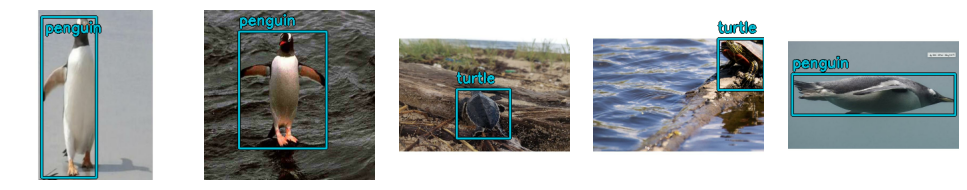

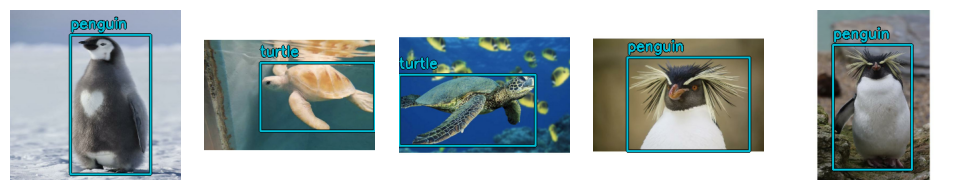

In [8]:
visualize_dataset(train_dataset)
visualize_dataset(test_dataset)

In [9]:
class EvaluateCOCOMetricsCallback(keras.callbacks.Callback):
    def __init__(self, data, save_path=None):
        super().__init__()
        self.data = data
        self.save_path = save_path
        self.metrics = keras_cv.metrics.BoxCOCOMetrics(
            bounding_box_format="xywh",
            evaluate_freq=1e9,
        )
        self.best_map = -1.0

    def on_epoch_end(self, epoch, logs):
        self.metrics.reset_state()
        for batch in tqdm(self.data, ascii=True, desc='Valid'):
            images, y_true = batch["images"], batch["bounding_boxes"]
            y_pred = self.model.predict(images, verbose=0)
            
            y_pred = keras_cv.bounding_box.to_dense(y_pred, max_boxes=16)
            y_true = keras_cv.bounding_box.to_dense(y_true, max_boxes=16)

            self.metrics.update_state(y_true, y_pred)

        metrics = self.metrics.result(force=True)
        logs.update(metrics)
        
        visualize_detections(self.model, dataset=self.data)
        
        current_map = metrics["MaP"]
        if self.save_path:
            if current_map > self.best_map:
                self.best_map = current_map
                self.model.save(self.save_path.replace('model', f'model-{epoch:02d}'))  # Save the model when mAP improves

        return logs
    
callbacks = [
    EvaluateCOCOMetricsCallback(test_dataset),
    tf.keras.callbacks.EarlyStopping(monitor='loss', patience=3),
    tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, min_lr=0.0005)
]


In [10]:
def training(model_name, callbacks, epochs=20):
    strategy = tf.distribute.MirroredStrategy()
    print('Number of devices: {}'.format(strategy.num_replicas_in_sync))

    if model_name == 'resnet50':
        with strategy.scope():
            model = keras_cv.models.RetinaNet(
                num_classes=len(CLASSES),
                bounding_box_format="xywh",
                backbone=keras_cv.models.ResNet50Backbone.from_preset(
                    "resnet50_imagenet",
                )
            )
        model.compile(
            optimizer=keras.optimizers.SGD(learning_rate=0.001, momentum=0.9, global_clipnorm=10.0),
            classification_loss='focal', box_loss='smoothl1'
        )
    else:
        with strategy.scope():
            model = keras_cv.models.YOLOV8Detector(
                num_classes=len(CLASSES),
                bounding_box_format="xywh",
                backbone=keras_cv.models.YOLOV8Backbone.from_preset(
                    "yolo_v8_s_backbone_coco",
                ),
                fpn_depth=2
            )
        model.compile(
            optimizer=tf.keras.optimizers.Adam(learning_rate=0.001, global_clipnorm=10.0),
            classification_loss="binary_crossentropy", box_loss="ciou"
        )
  
    model.backbone.trainable = False
    history = model.fit(
        train_dataset,
        validation_data=test_dataset,
        epochs=epochs,
        callbacks=callbacks
    )
    pd.DataFrame(history.history).plot()
    

INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0',)
Number of devices: 1
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localh

2023-11-08 06:49:20.559900: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:933] Skipping loop optimization for Merge node with control input: RaggedSplit/assert_equal_3/Assert/AssertGuard/branch_executed/_9
2023-11-08 06:49:25.590530: I tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:442] Loaded cuDNN version 8902
2023-11-08 06:49:35.738027: W tensorflow/tsl/framework/bfc_allocator.cc:296] Allocator (GPU_0_bfc) ran out of memory trying to allocate 1.17GiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.
2023-11-08 06:49:36.063493: W tensorflow/tsl/framework/bfc_allocator.cc:296] Allocator (GPU_0_bfc) ran out of memory trying to allocate 1.10GiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.
2023-11-08 06:49:36.325459: W tensorflow/tsl/framework/bfc_a

62/62 [==============================] - ETA: 0s - loss: 64.0869 - box_loss: 3.2118 - class_loss: 60.8751

2023-11-08 06:49:58.661759: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:933] Skipping loop optimization for Merge node with control input: RaggedSplit/assert_equal_3/Assert/AssertGuard/branch_executed/_9
Valid: 100%|##########| 9/9 [00:05<00:00,  1.68it/s]


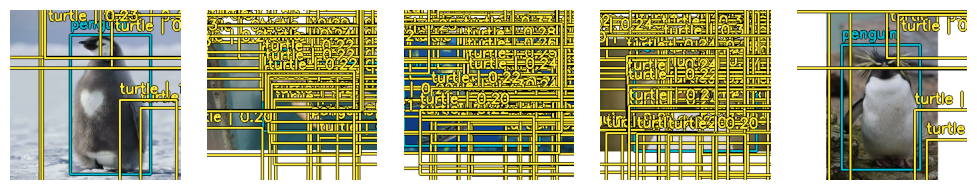

62/62 [==============================] - 64s 332ms/step - loss: 64.0869 - box_loss: 3.2118 - class_loss: 60.8751 - val_loss: 17.8783 - val_box_loss: 5.2391 - val_class_loss: 12.6392 - MaP: 0.0000e+00 - MaP@[IoU=50]: 0.0000e+00 - MaP@[IoU=75]: 0.0000e+00 - MaP@[area=small]: 0.0000e+00 - MaP@[area=medium]: 0.0000e+00 - MaP@[area=large]: 0.0000e+00 - Recall@[max_detections=1]: 0.0000e+00 - Recall@[max_detections=10]: 0.0000e+00 - Recall@[max_detections=100]: 0.0000e+00 - Recall@[area=small]: 0.0000e+00 - Recall@[area=medium]: 0.0000e+00 - Recall@[area=large]: 0.0000e+00 - lr: 0.0010
Epoch 2/20
62/62 [==============================] - ETA: 0s - loss: 11.6340 - box_loss: 3.1089 - class_loss: 8.5251

Valid: 100%|##########| 9/9 [00:01<00:00,  5.59it/s]


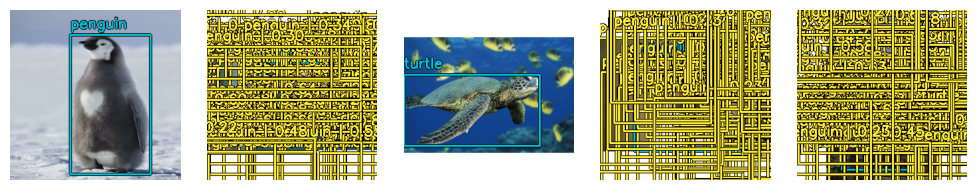

62/62 [==============================] - 12s 182ms/step - loss: 11.6340 - box_loss: 3.1089 - class_loss: 8.5251 - val_loss: 63.4158 - val_box_loss: 3.2568 - val_class_loss: 60.1590 - MaP: 1.1376e-04 - MaP@[IoU=50]: 7.8463e-04 - MaP@[IoU=75]: 1.1188e-05 - MaP@[area=small]: 0.0000e+00 - MaP@[area=medium]: 0.0000e+00 - MaP@[area=large]: 1.4580e-04 - Recall@[max_detections=1]: 0.0000e+00 - Recall@[max_detections=10]: 0.0056 - Recall@[max_detections=100]: 0.0583 - Recall@[area=small]: 0.0000e+00 - Recall@[area=medium]: 0.0000e+00 - Recall@[area=large]: 0.0750 - lr: 0.0010
Epoch 3/20
62/62 [==============================] - ETA: 0s - loss: 5.2385 - box_loss: 2.9171 - class_loss: 2.3213

Valid: 100%|##########| 9/9 [00:01<00:00,  5.36it/s]


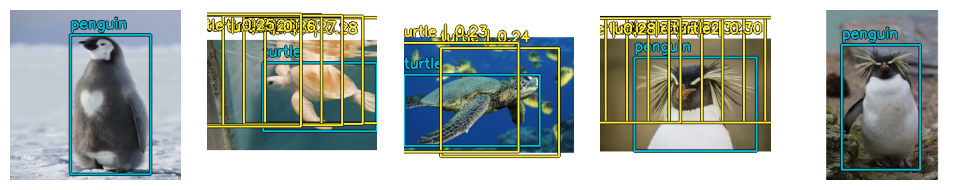

62/62 [==============================] - 12s 180ms/step - loss: 5.2385 - box_loss: 2.9171 - class_loss: 2.3213 - val_loss: 5.6301 - val_box_loss: 2.7042 - val_class_loss: 2.9259 - MaP: 0.0014 - MaP@[IoU=50]: 0.0090 - MaP@[IoU=75]: 0.0000e+00 - MaP@[area=small]: 0.0000e+00 - MaP@[area=medium]: 0.0000e+00 - MaP@[area=large]: 0.0016 - Recall@[max_detections=1]: 0.0225 - Recall@[max_detections=10]: 0.0275 - Recall@[max_detections=100]: 0.0275 - Recall@[area=small]: 0.0000e+00 - Recall@[area=medium]: 0.0000e+00 - Recall@[area=large]: 0.0324 - lr: 0.0010
Epoch 4/20
62/62 [==============================] - ETA: 0s - loss: 4.6933 - box_loss: 2.8346 - class_loss: 1.8587

Valid: 100%|##########| 9/9 [00:01<00:00,  5.48it/s]


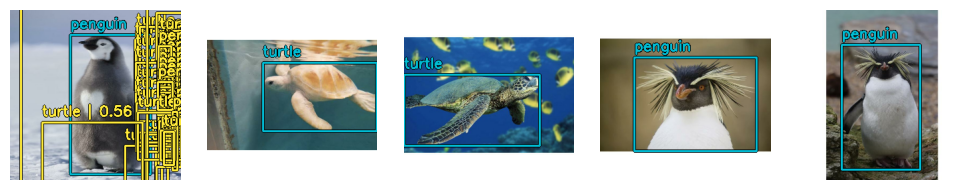

62/62 [==============================] - 11s 170ms/step - loss: 4.6933 - box_loss: 2.8346 - class_loss: 1.8587 - val_loss: 12.5419 - val_box_loss: 2.8033 - val_class_loss: 9.7386 - MaP: 0.0000e+00 - MaP@[IoU=50]: 0.0000e+00 - MaP@[IoU=75]: 0.0000e+00 - MaP@[area=small]: 0.0000e+00 - MaP@[area=medium]: 0.0000e+00 - MaP@[area=large]: 0.0000e+00 - Recall@[max_detections=1]: 0.0000e+00 - Recall@[max_detections=10]: 0.0000e+00 - Recall@[max_detections=100]: 0.0000e+00 - Recall@[area=small]: 0.0000e+00 - Recall@[area=medium]: 0.0000e+00 - Recall@[area=large]: 0.0000e+00 - lr: 0.0010
Epoch 5/20
62/62 [==============================] - ETA: 0s - loss: 4.4234 - box_loss: 2.7143 - class_loss: 1.7090

Valid: 100%|##########| 9/9 [00:01<00:00,  5.46it/s]


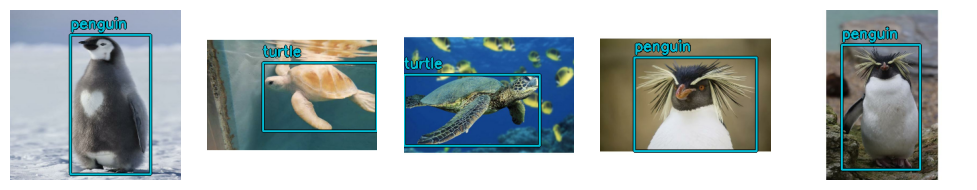

62/62 [==============================] - 11s 170ms/step - loss: 4.4234 - box_loss: 2.7143 - class_loss: 1.7090 - val_loss: 4.4204 - val_box_loss: 2.5400 - val_class_loss: 1.8804 - MaP: 0.0000e+00 - MaP@[IoU=50]: 0.0000e+00 - MaP@[IoU=75]: 0.0000e+00 - MaP@[area=small]: 0.0000e+00 - MaP@[area=medium]: 0.0000e+00 - MaP@[area=large]: 0.0000e+00 - Recall@[max_detections=1]: 0.0000e+00 - Recall@[max_detections=10]: 0.0000e+00 - Recall@[max_detections=100]: 0.0000e+00 - Recall@[area=small]: 0.0000e+00 - Recall@[area=medium]: 0.0000e+00 - Recall@[area=large]: 0.0000e+00 - lr: 0.0010
Epoch 6/20
62/62 [==============================] - ETA: 0s - loss: 4.3011 - box_loss: 2.6437 - class_loss: 1.6574

Valid: 100%|##########| 9/9 [00:01<00:00,  5.54it/s]


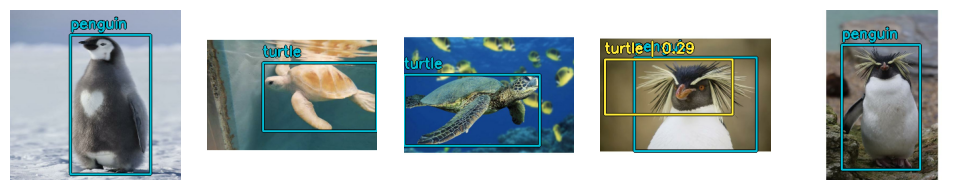

62/62 [==============================] - 11s 170ms/step - loss: 4.3011 - box_loss: 2.6437 - class_loss: 1.6574 - val_loss: 4.2984 - val_box_loss: 2.5680 - val_class_loss: 1.7304 - MaP: 0.0108 - MaP@[IoU=50]: 0.0260 - MaP@[IoU=75]: 0.0089 - MaP@[area=small]: 0.0000e+00 - MaP@[area=medium]: 0.0000e+00 - MaP@[area=large]: 0.0161 - Recall@[max_detections=1]: 0.0542 - Recall@[max_detections=10]: 0.0667 - Recall@[max_detections=100]: 0.0667 - Recall@[area=small]: 0.0000e+00 - Recall@[area=medium]: 0.0000e+00 - Recall@[area=large]: 0.1000 - lr: 0.0010
Epoch 7/20
62/62 [==============================] - ETA: 0s - loss: 4.2150 - box_loss: 2.5770 - class_loss: 1.6380

Valid: 100%|##########| 9/9 [00:01<00:00,  5.60it/s]


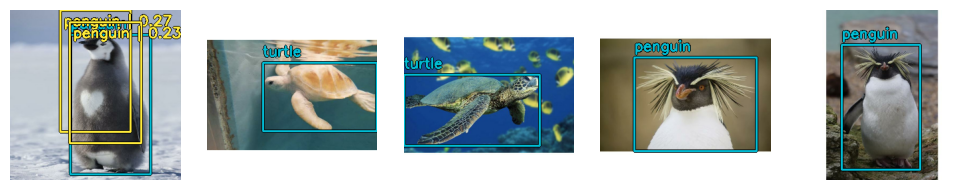

62/62 [==============================] - 11s 169ms/step - loss: 4.2150 - box_loss: 2.5770 - class_loss: 1.6380 - val_loss: 6.0168 - val_box_loss: 3.5796 - val_class_loss: 2.4372 - MaP: 6.5447e-04 - MaP@[IoU=50]: 0.0044 - MaP@[IoU=75]: 0.0000e+00 - MaP@[area=small]: 0.0000e+00 - MaP@[area=medium]: 0.0000e+00 - MaP@[area=large]: 0.0013 - Recall@[max_detections=1]: 0.0063 - Recall@[max_detections=10]: 0.0250 - Recall@[max_detections=100]: 0.0250 - Recall@[area=small]: 0.0000e+00 - Recall@[area=medium]: 0.0000e+00 - Recall@[area=large]: 0.0500 - lr: 0.0010
Epoch 8/20
62/62 [==============================] - ETA: 0s - loss: 4.0376 - box_loss: 2.5138 - class_loss: 1.5238

Valid: 100%|##########| 9/9 [00:01<00:00,  5.57it/s]


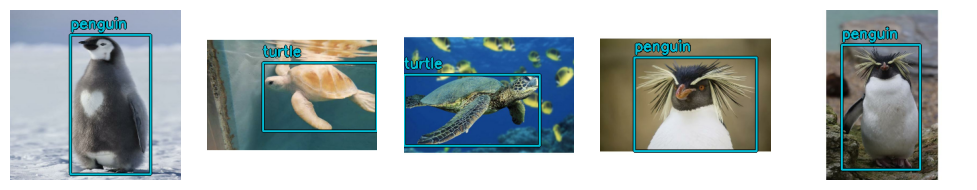

62/62 [==============================] - 11s 167ms/step - loss: 4.0376 - box_loss: 2.5138 - class_loss: 1.5238 - val_loss: 3.9908 - val_box_loss: 2.4776 - val_class_loss: 1.5132 - MaP: 0.2262 - MaP@[IoU=50]: 0.5000 - MaP@[IoU=75]: 0.2525 - MaP@[area=small]: 0.0000e+00 - MaP@[area=medium]: 0.0000e+00 - MaP@[area=large]: 0.2262 - Recall@[max_detections=1]: 0.2250 - Recall@[max_detections=10]: 0.2250 - Recall@[max_detections=100]: 0.2250 - Recall@[area=small]: 0.0000e+00 - Recall@[area=medium]: 0.0000e+00 - Recall@[area=large]: 0.2250 - lr: 0.0010
Epoch 9/20
62/62 [==============================] - ETA: 0s - loss: 3.9008 - box_loss: 2.4965 - class_loss: 1.4043

Valid: 100%|##########| 9/9 [00:01<00:00,  5.55it/s]


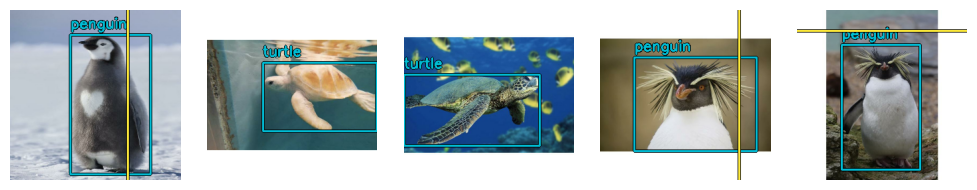

62/62 [==============================] - 11s 168ms/step - loss: 3.9008 - box_loss: 2.4965 - class_loss: 1.4043 - val_loss: 4.0679 - val_box_loss: 2.5006 - val_class_loss: 1.5674 - MaP: 0.0045 - MaP@[IoU=50]: 0.0074 - MaP@[IoU=75]: 0.0074 - MaP@[area=small]: 0.0000e+00 - MaP@[area=medium]: 0.0000e+00 - MaP@[area=large]: 0.0052 - Recall@[max_detections=1]: 0.0150 - Recall@[max_detections=10]: 0.0150 - Recall@[max_detections=100]: 0.0150 - Recall@[area=small]: 0.0000e+00 - Recall@[area=medium]: 0.0000e+00 - Recall@[area=large]: 0.0188 - lr: 0.0010
Epoch 10/20
62/62 [==============================] - ETA: 0s - loss: 3.8446 - box_loss: 2.4741 - class_loss: 1.3705

Valid: 100%|##########| 9/9 [00:01<00:00,  5.44it/s]


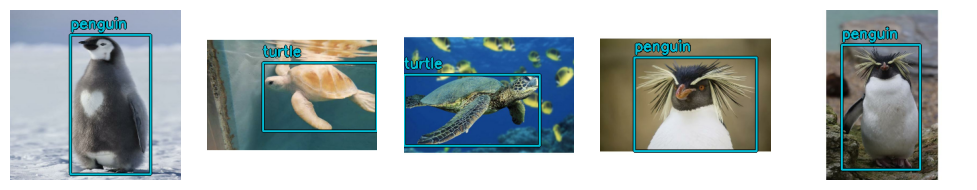

62/62 [==============================] - 11s 168ms/step - loss: 3.8446 - box_loss: 2.4741 - class_loss: 1.3705 - val_loss: 4.0455 - val_box_loss: 2.5091 - val_class_loss: 1.5364 - MaP: 0.0000e+00 - MaP@[IoU=50]: 0.0000e+00 - MaP@[IoU=75]: 0.0000e+00 - MaP@[area=small]: 0.0000e+00 - MaP@[area=medium]: 0.0000e+00 - MaP@[area=large]: 0.0000e+00 - Recall@[max_detections=1]: 0.0000e+00 - Recall@[max_detections=10]: 0.0000e+00 - Recall@[max_detections=100]: 0.0000e+00 - Recall@[area=small]: 0.0000e+00 - Recall@[area=medium]: 0.0000e+00 - Recall@[area=large]: 0.0000e+00 - lr: 0.0010
Epoch 11/20
62/62 [==============================] - ETA: 0s - loss: 3.6612 - box_loss: 2.3953 - class_loss: 1.2659

Valid: 100%|##########| 9/9 [00:01<00:00,  5.48it/s]


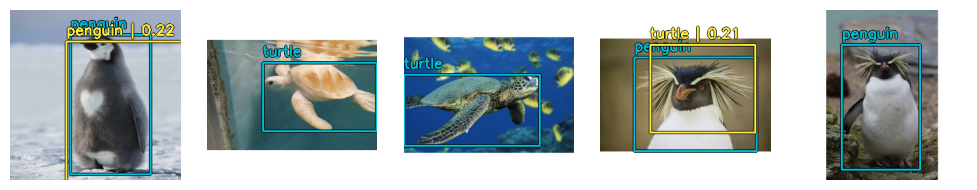

62/62 [==============================] - 11s 169ms/step - loss: 3.6612 - box_loss: 2.3953 - class_loss: 1.2659 - val_loss: 3.6556 - val_box_loss: 2.4222 - val_class_loss: 1.2334 - MaP: 0.1658 - MaP@[IoU=50]: 0.4305 - MaP@[IoU=75]: 0.1287 - MaP@[area=small]: 0.0000e+00 - MaP@[area=medium]: 0.1000 - MaP@[area=large]: 0.1699 - Recall@[max_detections=1]: 0.1920 - Recall@[max_detections=10]: 0.2011 - Recall@[max_detections=100]: 0.2011 - Recall@[area=small]: 0.0000e+00 - Recall@[area=medium]: 0.1000 - Recall@[area=large]: 0.2075 - lr: 0.0010
Epoch 12/20
62/62 [==============================] - ETA: 0s - loss: 3.5457 - box_loss: 2.3373 - class_loss: 1.2084

Valid: 100%|##########| 9/9 [00:01<00:00,  5.58it/s]


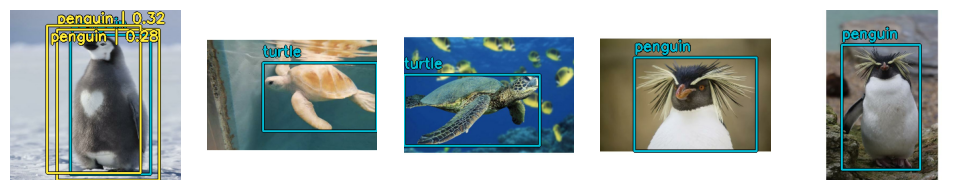

62/62 [==============================] - 11s 166ms/step - loss: 3.5457 - box_loss: 2.3373 - class_loss: 1.2084 - val_loss: 3.7227 - val_box_loss: 2.4423 - val_class_loss: 1.2804 - MaP: 0.5000 - MaP@[IoU=50]: 1.0000 - MaP@[IoU=75]: 0.0000e+00 - MaP@[area=small]: 0.0000e+00 - MaP@[area=medium]: 0.0000e+00 - MaP@[area=large]: 0.5000 - Recall@[max_detections=1]: 0.5000 - Recall@[max_detections=10]: 0.5000 - Recall@[max_detections=100]: 0.5000 - Recall@[area=small]: 0.0000e+00 - Recall@[area=medium]: 0.0000e+00 - Recall@[area=large]: 0.5000 - lr: 0.0010
Epoch 13/20
62/62 [==============================] - ETA: 0s - loss: 3.5260 - box_loss: 2.3549 - class_loss: 1.1711

Valid: 100%|##########| 9/9 [00:01<00:00,  5.55it/s]


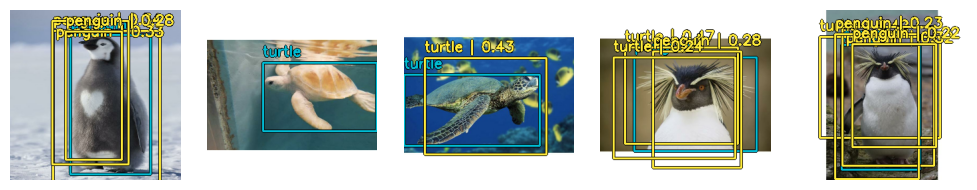

62/62 [==============================] - 11s 166ms/step - loss: 3.5260 - box_loss: 2.3549 - class_loss: 1.1711 - val_loss: 3.8104 - val_box_loss: 2.4704 - val_class_loss: 1.3400 - MaP: 0.0850 - MaP@[IoU=50]: 0.2796 - MaP@[IoU=75]: 0.0128 - MaP@[area=small]: 0.0000e+00 - MaP@[area=medium]: 0.0000e+00 - MaP@[area=large]: 0.0964 - Recall@[max_detections=1]: 0.1537 - Recall@[max_detections=10]: 0.1857 - Recall@[max_detections=100]: 0.1857 - Recall@[area=small]: 0.0000e+00 - Recall@[area=medium]: 0.0000e+00 - Recall@[area=large]: 0.2148 - lr: 0.0010
Epoch 14/20
62/62 [==============================] - ETA: 0s - loss: 3.4250 - box_loss: 2.2688 - class_loss: 1.1562

Valid: 100%|##########| 9/9 [00:01<00:00,  5.29it/s]


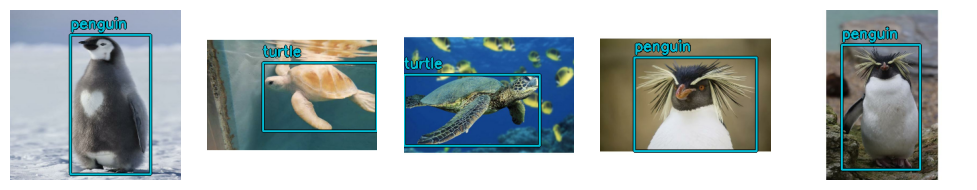

62/62 [==============================] - 11s 171ms/step - loss: 3.4250 - box_loss: 2.2688 - class_loss: 1.1562 - val_loss: 3.5339 - val_box_loss: 2.3574 - val_class_loss: 1.1765 - MaP: 0.4515 - MaP@[IoU=50]: 1.0000 - MaP@[IoU=75]: 0.5050 - MaP@[area=small]: 0.0000e+00 - MaP@[area=medium]: 0.0000e+00 - MaP@[area=large]: 0.4515 - Recall@[max_detections=1]: 0.4500 - Recall@[max_detections=10]: 0.4500 - Recall@[max_detections=100]: 0.4500 - Recall@[area=small]: 0.0000e+00 - Recall@[area=medium]: 0.0000e+00 - Recall@[area=large]: 0.4500 - lr: 0.0010
Epoch 15/20
62/62 [==============================] - ETA: 0s - loss: 3.3137 - box_loss: 2.1951 - class_loss: 1.1186

Valid: 100%|##########| 9/9 [00:01<00:00,  5.42it/s]


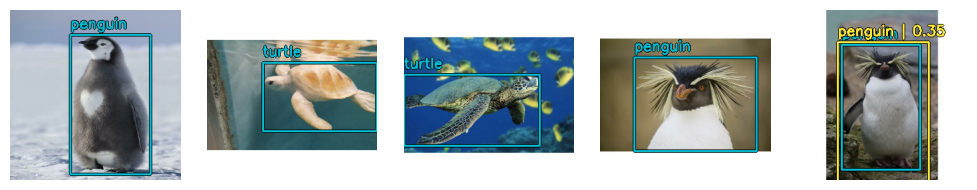

62/62 [==============================] - 11s 170ms/step - loss: 3.3137 - box_loss: 2.1951 - class_loss: 1.1186 - val_loss: 3.6801 - val_box_loss: 2.4711 - val_class_loss: 1.2090 - MaP: 0.2271 - MaP@[IoU=50]: 0.8131 - MaP@[IoU=75]: 0.0842 - MaP@[area=small]: 0.0000e+00 - MaP@[area=medium]: 0.2000 - MaP@[area=large]: 0.2432 - Recall@[max_detections=1]: 0.2417 - Recall@[max_detections=10]: 0.2583 - Recall@[max_detections=100]: 0.2583 - Recall@[area=small]: 0.0000e+00 - Recall@[area=medium]: 0.2000 - Recall@[area=large]: 0.2700 - lr: 0.0010
Epoch 16/20
62/62 [==============================] - ETA: 0s - loss: 3.2616 - box_loss: 2.1840 - class_loss: 1.0776

Valid: 100%|##########| 9/9 [00:01<00:00,  5.32it/s]


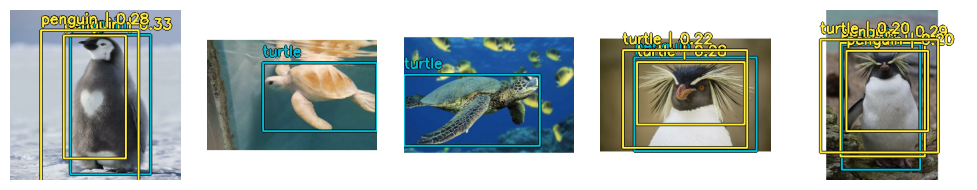

62/62 [==============================] - 11s 173ms/step - loss: 3.2616 - box_loss: 2.1840 - class_loss: 1.0776 - val_loss: 3.5344 - val_box_loss: 2.3084 - val_class_loss: 1.2259 - MaP: 0.0868 - MaP@[IoU=50]: 0.3393 - MaP@[IoU=75]: 0.0050 - MaP@[area=small]: 0.0000e+00 - MaP@[area=medium]: 0.0673 - MaP@[area=large]: 0.0922 - Recall@[max_detections=1]: 0.1618 - Recall@[max_detections=10]: 0.1907 - Recall@[max_detections=100]: 0.1907 - Recall@[area=small]: 0.0000e+00 - Recall@[area=medium]: 0.0667 - Recall@[area=large]: 0.2147 - lr: 0.0010
Epoch 17/20
62/62 [==============================] - ETA: 0s - loss: 3.1517 - box_loss: 2.1041 - class_loss: 1.0476

Valid: 100%|##########| 9/9 [00:01<00:00,  5.35it/s]


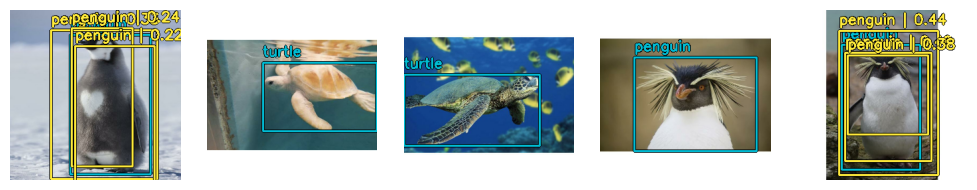

62/62 [==============================] - 11s 168ms/step - loss: 3.1517 - box_loss: 2.1041 - class_loss: 1.0476 - val_loss: 3.3735 - val_box_loss: 2.2528 - val_class_loss: 1.1207 - MaP: 0.2037 - MaP@[IoU=50]: 0.4829 - MaP@[IoU=75]: 0.1034 - MaP@[area=small]: 0.0000e+00 - MaP@[area=medium]: 0.1010 - MaP@[area=large]: 0.2020 - Recall@[max_detections=1]: 0.2891 - Recall@[max_detections=10]: 0.2982 - Recall@[max_detections=100]: 0.2982 - Recall@[area=small]: 0.0000e+00 - Recall@[area=medium]: 0.1000 - Recall@[area=large]: 0.3182 - lr: 0.0010
Epoch 18/20
62/62 [==============================] - ETA: 0s - loss: 3.0943 - box_loss: 2.0704 - class_loss: 1.0239

Valid: 100%|##########| 9/9 [00:01<00:00,  5.38it/s]


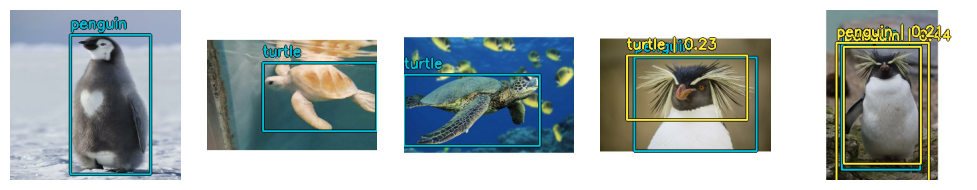

62/62 [==============================] - 11s 168ms/step - loss: 3.0943 - box_loss: 2.0704 - class_loss: 1.0239 - val_loss: 3.3616 - val_box_loss: 2.2489 - val_class_loss: 1.1127 - MaP: 0.1586 - MaP@[IoU=50]: 0.5749 - MaP@[IoU=75]: 0.0725 - MaP@[area=small]: 0.0000e+00 - MaP@[area=medium]: 0.2020 - MaP@[area=large]: 0.1643 - Recall@[max_detections=1]: 0.2600 - Recall@[max_detections=10]: 0.2833 - Recall@[max_detections=100]: 0.2833 - Recall@[area=small]: 0.0000e+00 - Recall@[area=medium]: 0.2000 - Recall@[area=large]: 0.2910 - lr: 0.0010
Epoch 19/20
62/62 [==============================] - ETA: 0s - loss: 3.0991 - box_loss: 2.0821 - class_loss: 1.0170

Valid: 100%|##########| 9/9 [00:01<00:00,  5.38it/s]


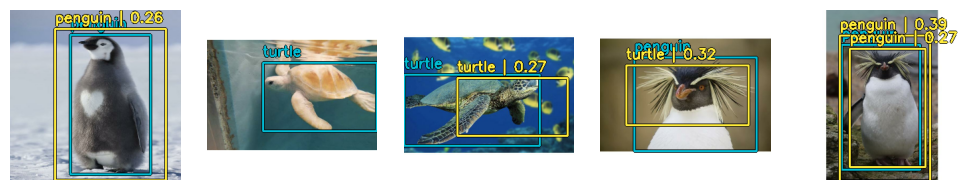

62/62 [==============================] - 11s 170ms/step - loss: 3.0991 - box_loss: 2.0821 - class_loss: 1.0170 - val_loss: 3.3430 - val_box_loss: 2.2610 - val_class_loss: 1.0820 - MaP: 0.1084 - MaP@[IoU=50]: 0.3918 - MaP@[IoU=75]: 0.0147 - MaP@[area=small]: 0.0000e+00 - MaP@[area=medium]: 0.1208 - MaP@[area=large]: 0.1172 - Recall@[max_detections=1]: 0.2049 - Recall@[max_detections=10]: 0.2336 - Recall@[max_detections=100]: 0.2336 - Recall@[area=small]: 0.0000e+00 - Recall@[area=medium]: 0.1187 - Recall@[area=large]: 0.2786 - lr: 0.0010
Epoch 20/20
62/62 [==============================] - ETA: 0s - loss: 2.9838 - box_loss: 2.0004 - class_loss: 0.9834

Valid: 100%|##########| 9/9 [00:01<00:00,  5.41it/s]


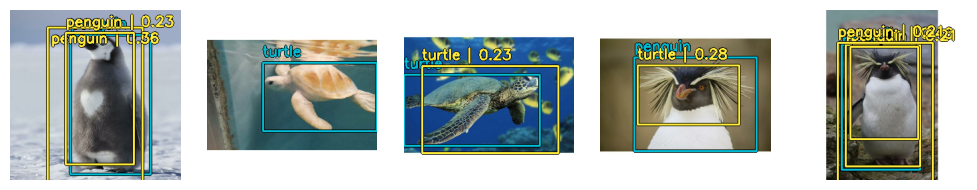

62/62 [==============================] - 11s 170ms/step - loss: 2.9838 - box_loss: 2.0004 - class_loss: 0.9834 - val_loss: 3.3014 - val_box_loss: 2.2578 - val_class_loss: 1.0436 - MaP: 0.1960 - MaP@[IoU=50]: 0.6506 - MaP@[IoU=75]: 0.0423 - MaP@[area=small]: 0.0000e+00 - MaP@[area=medium]: 0.2894 - MaP@[area=large]: 0.1858 - Recall@[max_detections=1]: 0.2947 - Recall@[max_detections=10]: 0.3178 - Recall@[max_detections=100]: 0.3178 - Recall@[area=small]: 0.0000e+00 - Recall@[area=medium]: 0.3625 - Recall@[area=large]: 0.3000 - lr: 0.0010


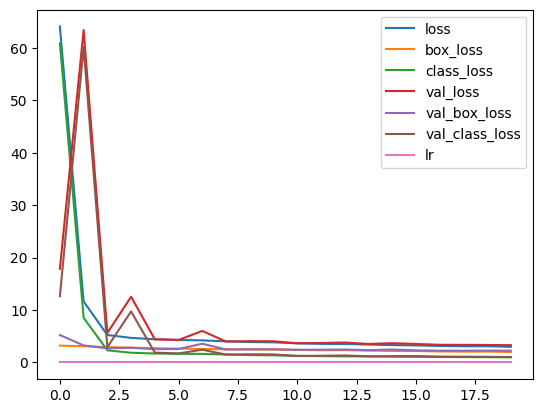

In [11]:
training('yolov8', callbacks=callbacks)

INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0',)
Number of devices: 1
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localh

2023-11-08 06:55:35.753659: I tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:442] Loaded cuDNN version 8902
2023-11-08 06:55:42.251353: W tensorflow/tsl/framework/bfc_allocator.cc:296] Allocator (GPU_0_bfc) ran out of memory trying to allocate 305.00MiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.
2023-11-08 06:55:43.484764: W tensorflow/tsl/framework/bfc_allocator.cc:296] Allocator (GPU_0_bfc) ran out of memory trying to allocate 305.00MiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.
2023-11-08 06:55:43.484814: W tensorflow/tsl/framework/bfc_allocator.cc:296] Allocator (GPU_0_bfc) ran out of memory trying to allocate 604.81MiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gain

34/62 [===============>..............] - ETA: 6s - loss: 1.6650 - box_loss: 0.6731 - classification_loss: 0.9919 - percent_boxes_matched_with_anchor: 0.0000e+00

2023-11-08 06:55:59.416433: W tensorflow/tsl/framework/bfc_allocator.cc:296] Allocator (GPU_0_bfc) ran out of memory trying to allocate 136.00MiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.
2023-11-08 06:55:59.417996: W tensorflow/tsl/framework/bfc_allocator.cc:296] Allocator (GPU_0_bfc) ran out of memory trying to allocate 136.00MiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.
2023-11-08 06:55:59.418308: W tensorflow/tsl/framework/bfc_allocator.cc:296] Allocator (GPU_0_bfc) ran out of memory trying to allocate 136.00MiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.
2023-11-08 06:55:59.418588: W tensorflow/tsl/framework/bfc_allocator.cc:296] Allocato

62/62 [==============================] - ETA: 0s - loss: 1.5456 - box_loss: 0.6589 - classification_loss: 0.8867 - percent_boxes_matched_with_anchor: 0.0000e+00

Valid: 100%|##########| 9/9 [00:11<00:00,  1.24s/it]


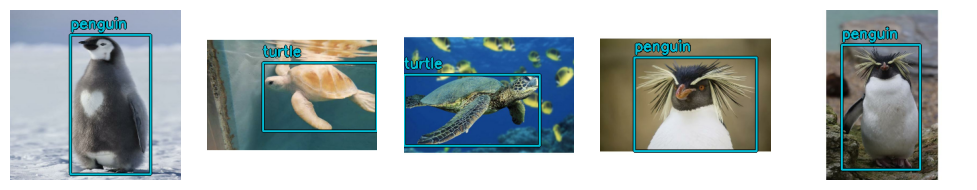

62/62 [==============================] - 63s 546ms/step - loss: 1.5456 - box_loss: 0.6589 - classification_loss: 0.8867 - percent_boxes_matched_with_anchor: 0.0000e+00 - val_loss: 1.3196 - val_box_loss: 0.6425 - val_classification_loss: 0.6771 - val_percent_boxes_matched_with_anchor: 0.0000e+00 - MaP: 0.0741 - MaP@[IoU=50]: 0.2679 - MaP@[IoU=75]: 0.0000e+00 - MaP@[area=small]: 0.0000e+00 - MaP@[area=medium]: 0.1002 - MaP@[area=large]: 0.0690 - Recall@[max_detections=1]: 0.1250 - Recall@[max_detections=10]: 0.1500 - Recall@[max_detections=100]: 0.1500 - Recall@[area=small]: 0.0000e+00 - Recall@[area=medium]: 0.1500 - Recall@[area=large]: 0.1500 - lr: 0.0010
Epoch 2/20
62/62 [==============================] - ETA: 0s - loss: 1.1826 - box_loss: 0.6083 - classification_loss: 0.5743 - percent_boxes_matched_with_anchor: 0.0000e+00

Valid: 100%|##########| 9/9 [00:07<00:00,  1.21it/s]


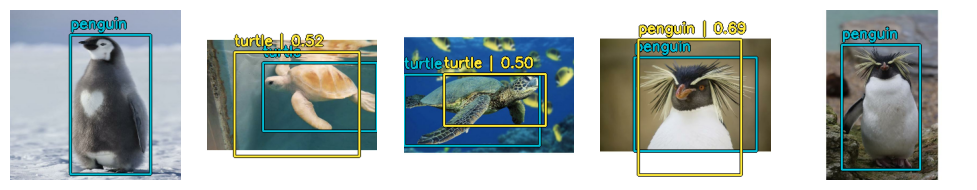

62/62 [==============================] - 26s 415ms/step - loss: 1.1826 - box_loss: 0.6083 - classification_loss: 0.5743 - percent_boxes_matched_with_anchor: 0.0000e+00 - val_loss: 1.0832 - val_box_loss: 0.5912 - val_classification_loss: 0.4920 - val_percent_boxes_matched_with_anchor: 0.0000e+00 - MaP: 0.1113 - MaP@[IoU=50]: 0.4357 - MaP@[IoU=75]: 0.0083 - MaP@[area=small]: 0.0000e+00 - MaP@[area=medium]: 0.1865 - MaP@[area=large]: 0.1070 - Recall@[max_detections=1]: 0.1995 - Recall@[max_detections=10]: 0.2472 - Recall@[max_detections=100]: 0.2472 - Recall@[area=small]: 0.0000e+00 - Recall@[area=medium]: 0.2167 - Recall@[area=large]: 0.2600 - lr: 0.0010
Epoch 3/20
62/62 [==============================] - ETA: 0s - loss: 0.9834 - box_loss: 0.5397 - classification_loss: 0.4437 - percent_boxes_matched_with_anchor: 0.0000e+00

Valid: 100%|##########| 9/9 [00:07<00:00,  1.22it/s]


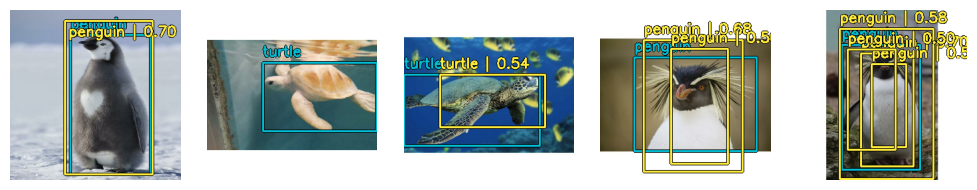

62/62 [==============================] - 26s 412ms/step - loss: 0.9834 - box_loss: 0.5397 - classification_loss: 0.4437 - percent_boxes_matched_with_anchor: 0.0000e+00 - val_loss: 1.4653 - val_box_loss: 0.5143 - val_classification_loss: 0.9510 - val_percent_boxes_matched_with_anchor: 0.0000e+00 - MaP: 0.0471 - MaP@[IoU=50]: 0.1894 - MaP@[IoU=75]: 0.0024 - MaP@[area=small]: 0.0000e+00 - MaP@[area=medium]: 0.0382 - MaP@[area=large]: 0.1444 - Recall@[max_detections=1]: 0.2483 - Recall@[max_detections=10]: 0.2839 - Recall@[max_detections=100]: 0.2861 - Recall@[area=small]: 0.0000e+00 - Recall@[area=medium]: 0.2625 - Recall@[area=large]: 0.2895 - lr: 0.0010
Epoch 4/20
62/62 [==============================] - ETA: 0s - loss: 0.8244 - box_loss: 0.4540 - classification_loss: 0.3704 - percent_boxes_matched_with_anchor: 0.0000e+00

Valid: 100%|##########| 9/9 [00:07<00:00,  1.21it/s]


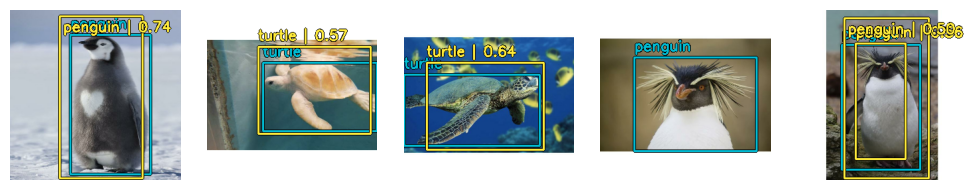

62/62 [==============================] - 26s 414ms/step - loss: 0.8244 - box_loss: 0.4540 - classification_loss: 0.3704 - percent_boxes_matched_with_anchor: 0.0000e+00 - val_loss: 1.8932 - val_box_loss: 0.4621 - val_classification_loss: 1.4310 - val_percent_boxes_matched_with_anchor: 0.0000e+00 - MaP: 0.0481 - MaP@[IoU=50]: 0.1707 - MaP@[IoU=75]: 0.0064 - MaP@[area=small]: 0.0000e+00 - MaP@[area=medium]: 0.0272 - MaP@[area=large]: 0.1789 - Recall@[max_detections=1]: 0.2390 - Recall@[max_detections=10]: 0.2677 - Recall@[max_detections=100]: 0.2842 - Recall@[area=small]: 0.0000e+00 - Recall@[area=medium]: 0.2062 - Recall@[area=large]: 0.3105 - lr: 0.0010
Epoch 5/20
62/62 [==============================] - ETA: 0s - loss: 0.7301 - box_loss: 0.4011 - classification_loss: 0.3290 - percent_boxes_matched_with_anchor: 0.0000e+00

Valid: 100%|##########| 9/9 [00:07<00:00,  1.19it/s]


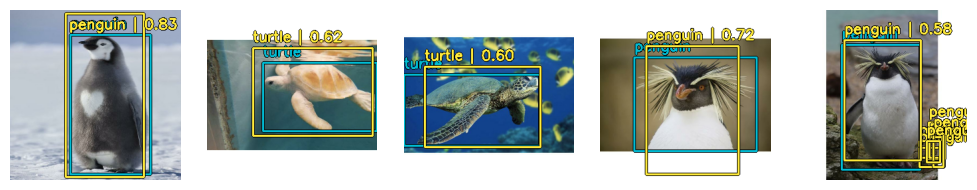

62/62 [==============================] - 26s 415ms/step - loss: 0.7301 - box_loss: 0.4011 - classification_loss: 0.3290 - percent_boxes_matched_with_anchor: 0.0000e+00 - val_loss: 3.2536 - val_box_loss: 0.4405 - val_classification_loss: 2.8130 - val_percent_boxes_matched_with_anchor: 0.0000e+00 - MaP: 0.0641 - MaP@[IoU=50]: 0.2086 - MaP@[IoU=75]: 0.0044 - MaP@[area=small]: 0.0000e+00 - MaP@[area=medium]: 0.0555 - MaP@[area=large]: 0.1944 - Recall@[max_detections=1]: 0.2552 - Recall@[max_detections=10]: 0.3211 - Recall@[max_detections=100]: 0.3211 - Recall@[area=small]: 0.0000e+00 - Recall@[area=medium]: 0.2839 - Recall@[area=large]: 0.3294 - lr: 0.0010
Epoch 6/20
62/62 [==============================] - ETA: 0s - loss: 0.6482 - box_loss: 0.3588 - classification_loss: 0.2894 - percent_boxes_matched_with_anchor: 0.0000e+00

Valid: 100%|##########| 9/9 [00:07<00:00,  1.20it/s]


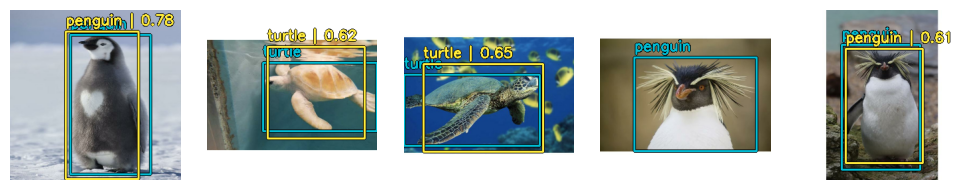

62/62 [==============================] - 26s 416ms/step - loss: 0.6482 - box_loss: 0.3588 - classification_loss: 0.2894 - percent_boxes_matched_with_anchor: 0.0000e+00 - val_loss: 1.1885 - val_box_loss: 0.4255 - val_classification_loss: 0.7629 - val_percent_boxes_matched_with_anchor: 0.0000e+00 - MaP: 0.0786 - MaP@[IoU=50]: 0.3064 - MaP@[IoU=75]: 0.0109 - MaP@[area=small]: 0.0000e+00 - MaP@[area=medium]: 0.0782 - MaP@[area=large]: 0.2117 - Recall@[max_detections=1]: 0.2853 - Recall@[max_detections=10]: 0.3056 - Recall@[max_detections=100]: 0.3056 - Recall@[area=small]: 0.0000e+00 - Recall@[area=medium]: 0.2512 - Recall@[area=large]: 0.3243 - lr: 0.0010
Epoch 7/20
62/62 [==============================] - ETA: 0s - loss: 0.5983 - box_loss: 0.3340 - classification_loss: 0.2642 - percent_boxes_matched_with_anchor: 0.0000e+00

Valid: 100%|##########| 9/9 [00:07<00:00,  1.21it/s]


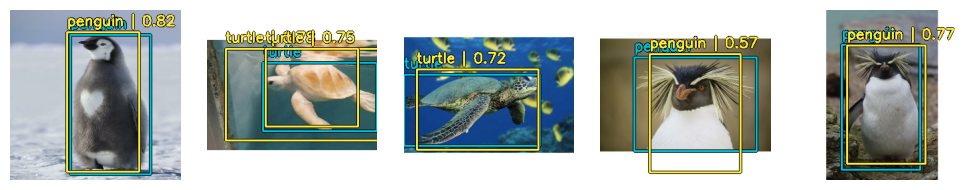

62/62 [==============================] - 26s 414ms/step - loss: 0.5983 - box_loss: 0.3340 - classification_loss: 0.2642 - percent_boxes_matched_with_anchor: 0.0000e+00 - val_loss: 1.2898 - val_box_loss: 0.4031 - val_classification_loss: 0.8867 - val_percent_boxes_matched_with_anchor: 0.0000e+00 - MaP: 0.1522 - MaP@[IoU=50]: 0.4583 - MaP@[IoU=75]: 0.0208 - MaP@[area=small]: 0.0000e+00 - MaP@[area=medium]: 0.1454 - MaP@[area=large]: 0.2923 - Recall@[max_detections=1]: 0.3571 - Recall@[max_detections=10]: 0.3727 - Recall@[max_detections=100]: 0.3727 - Recall@[area=small]: 0.0000e+00 - Recall@[area=medium]: 0.3000 - Recall@[area=large]: 0.3968 - lr: 0.0010
Epoch 8/20
62/62 [==============================] - ETA: 0s - loss: 0.5512 - box_loss: 0.3097 - classification_loss: 0.2415 - percent_boxes_matched_with_anchor: 0.0000e+00

Valid: 100%|##########| 9/9 [00:07<00:00,  1.18it/s]


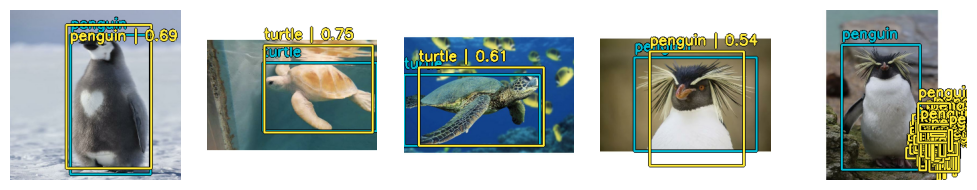

62/62 [==============================] - 27s 422ms/step - loss: 0.5512 - box_loss: 0.3097 - classification_loss: 0.2415 - percent_boxes_matched_with_anchor: 0.0000e+00 - val_loss: 6.1796 - val_box_loss: 0.3757 - val_classification_loss: 5.8039 - val_percent_boxes_matched_with_anchor: 0.0000e+00 - MaP: 0.1101 - MaP@[IoU=50]: 0.3274 - MaP@[IoU=75]: 0.0197 - MaP@[area=small]: 0.0000e+00 - MaP@[area=medium]: 0.0942 - MaP@[area=large]: 0.2743 - Recall@[max_detections=1]: 0.3208 - Recall@[max_detections=10]: 0.3346 - Recall@[max_detections=100]: 0.3346 - Recall@[area=small]: 0.0000e+00 - Recall@[area=medium]: 0.3071 - Recall@[area=large]: 0.3430 - lr: 5.0000e-04
Epoch 9/20
62/62 [==============================] - ETA: 0s - loss: 0.5154 - box_loss: 0.2884 - classification_loss: 0.2270 - percent_boxes_matched_with_anchor: 0.0000e+00

Valid: 100%|##########| 9/9 [00:07<00:00,  1.20it/s]


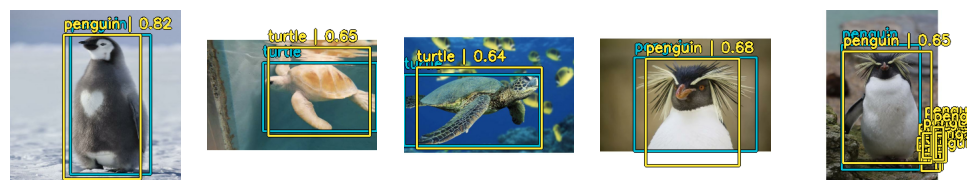

62/62 [==============================] - 26s 413ms/step - loss: 0.5154 - box_loss: 0.2884 - classification_loss: 0.2270 - percent_boxes_matched_with_anchor: 0.0000e+00 - val_loss: 0.9950 - val_box_loss: 0.3659 - val_classification_loss: 0.6291 - val_percent_boxes_matched_with_anchor: 0.0000e+00 - MaP: 0.1571 - MaP@[IoU=50]: 0.4743 - MaP@[IoU=75]: 0.0446 - MaP@[area=small]: 0.0000e+00 - MaP@[area=medium]: 0.2610 - MaP@[area=large]: 0.3106 - Recall@[max_detections=1]: 0.3579 - Recall@[max_detections=10]: 0.3819 - Recall@[max_detections=100]: 0.3819 - Recall@[area=small]: 0.0000e+00 - Recall@[area=medium]: 0.4262 - Recall@[area=large]: 0.3724 - lr: 5.0000e-04
Epoch 10/20
62/62 [==============================] - ETA: 0s - loss: 0.4936 - box_loss: 0.2743 - classification_loss: 0.2193 - percent_boxes_matched_with_anchor: 0.0000e+00

Valid: 100%|##########| 9/9 [00:07<00:00,  1.20it/s]


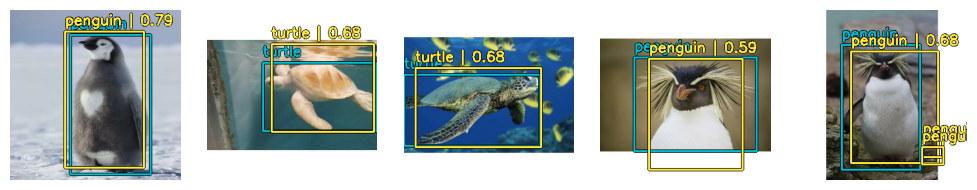

62/62 [==============================] - 26s 412ms/step - loss: 0.4936 - box_loss: 0.2743 - classification_loss: 0.2193 - percent_boxes_matched_with_anchor: 0.0000e+00 - val_loss: 0.7016 - val_box_loss: 0.3601 - val_classification_loss: 0.3414 - val_percent_boxes_matched_with_anchor: 0.0000e+00 - MaP: 0.1858 - MaP@[IoU=50]: 0.5533 - MaP@[IoU=75]: 0.0724 - MaP@[area=small]: 0.0000e+00 - MaP@[area=medium]: 0.2188 - MaP@[area=large]: 0.3441 - Recall@[max_detections=1]: 0.3737 - Recall@[max_detections=10]: 0.3782 - Recall@[max_detections=100]: 0.3873 - Recall@[area=small]: 0.0000e+00 - Recall@[area=medium]: 0.3274 - Recall@[area=large]: 0.4094 - lr: 5.0000e-04
Epoch 11/20
62/62 [==============================] - ETA: 0s - loss: 0.4719 - box_loss: 0.2633 - classification_loss: 0.2086 - percent_boxes_matched_with_anchor: 0.0000e+00

Valid: 100%|##########| 9/9 [00:07<00:00,  1.22it/s]


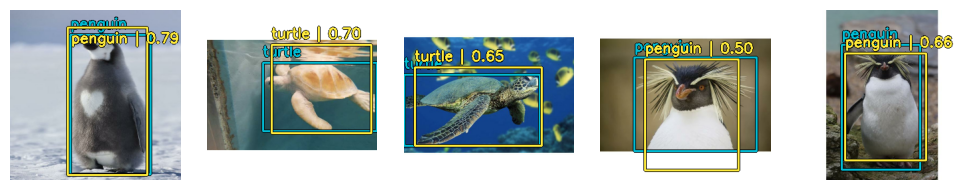

62/62 [==============================] - 26s 413ms/step - loss: 0.4719 - box_loss: 0.2633 - classification_loss: 0.2086 - percent_boxes_matched_with_anchor: 0.0000e+00 - val_loss: 0.7354 - val_box_loss: 0.3549 - val_classification_loss: 0.3805 - val_percent_boxes_matched_with_anchor: 0.0000e+00 - MaP: 0.1765 - MaP@[IoU=50]: 0.5298 - MaP@[IoU=75]: 0.0561 - MaP@[area=small]: 0.0000e+00 - MaP@[area=medium]: 0.2504 - MaP@[area=large]: 0.3266 - Recall@[max_detections=1]: 0.3857 - Recall@[max_detections=10]: 0.3857 - Recall@[max_detections=100]: 0.3857 - Recall@[area=small]: 0.0000e+00 - Recall@[area=medium]: 0.3625 - Recall@[area=large]: 0.3912 - lr: 5.0000e-04
Epoch 12/20
62/62 [==============================] - ETA: 0s - loss: 0.4535 - box_loss: 0.2518 - classification_loss: 0.2017 - percent_boxes_matched_with_anchor: 0.0000e+00

Valid: 100%|##########| 9/9 [00:07<00:00,  1.20it/s]


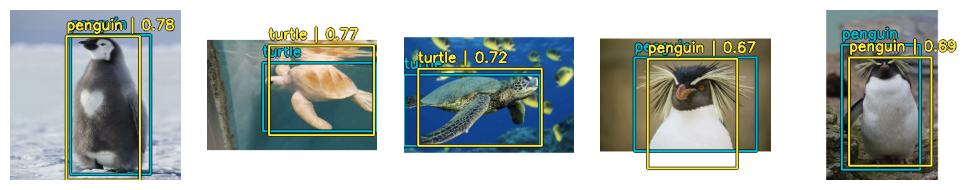

62/62 [==============================] - 26s 416ms/step - loss: 0.4535 - box_loss: 0.2518 - classification_loss: 0.2017 - percent_boxes_matched_with_anchor: 0.0000e+00 - val_loss: 0.6447 - val_box_loss: 0.3490 - val_classification_loss: 0.2956 - val_percent_boxes_matched_with_anchor: 0.0000e+00 - MaP: 0.2593 - MaP@[IoU=50]: 0.7220 - MaP@[IoU=75]: 0.0631 - MaP@[area=small]: 0.0000e+00 - MaP@[area=medium]: 0.2676 - MaP@[area=large]: 0.3609 - Recall@[max_detections=1]: 0.3910 - Recall@[max_detections=10]: 0.3910 - Recall@[max_detections=100]: 0.4019 - Recall@[area=small]: 0.0000e+00 - Recall@[area=medium]: 0.3250 - Recall@[area=large]: 0.4299 - lr: 5.0000e-04
Epoch 13/20
62/62 [==============================] - ETA: 0s - loss: 0.4341 - box_loss: 0.2407 - classification_loss: 0.1935 - percent_boxes_matched_with_anchor: 0.0000e+00

Valid: 100%|##########| 9/9 [00:07<00:00,  1.20it/s]


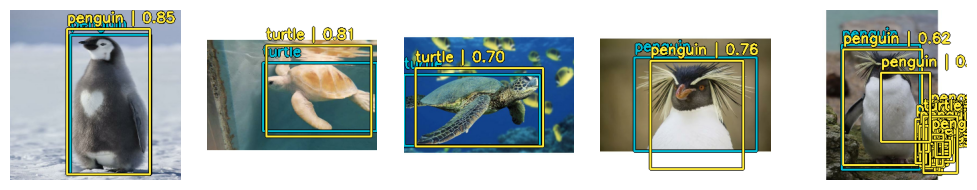

62/62 [==============================] - 26s 413ms/step - loss: 0.4341 - box_loss: 0.2407 - classification_loss: 0.1935 - percent_boxes_matched_with_anchor: 0.0000e+00 - val_loss: 2.0025 - val_box_loss: 0.3421 - val_classification_loss: 1.6604 - val_percent_boxes_matched_with_anchor: 0.0000e+00 - MaP: 0.1606 - MaP@[IoU=50]: 0.4566 - MaP@[IoU=75]: 0.0577 - MaP@[area=small]: 0.0000e+00 - MaP@[area=medium]: 0.2114 - MaP@[area=large]: 0.3411 - Recall@[max_detections=1]: 0.3915 - Recall@[max_detections=10]: 0.3915 - Recall@[max_detections=100]: 0.4115 - Recall@[area=small]: 0.0000e+00 - Recall@[area=medium]: 0.4190 - Recall@[area=large]: 0.4086 - lr: 5.0000e-04
Epoch 14/20
62/62 [==============================] - ETA: 0s - loss: 0.4138 - box_loss: 0.2286 - classification_loss: 0.1852 - percent_boxes_matched_with_anchor: 0.0000e+00

Valid: 100%|##########| 9/9 [00:08<00:00,  1.12it/s]


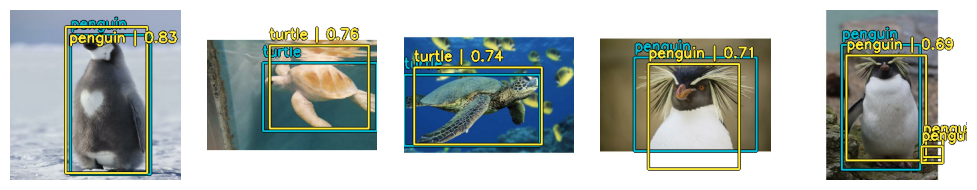

62/62 [==============================] - 27s 424ms/step - loss: 0.4138 - box_loss: 0.2286 - classification_loss: 0.1852 - percent_boxes_matched_with_anchor: 0.0000e+00 - val_loss: 0.6746 - val_box_loss: 0.3401 - val_classification_loss: 0.3345 - val_percent_boxes_matched_with_anchor: 0.0000e+00 - MaP: 0.2060 - MaP@[IoU=50]: 0.5589 - MaP@[IoU=75]: 0.0679 - MaP@[area=small]: 0.0000e+00 - MaP@[area=medium]: 0.2652 - MaP@[area=large]: 0.3672 - Recall@[max_detections=1]: 0.4042 - Recall@[max_detections=10]: 0.4042 - Recall@[max_detections=100]: 0.4146 - Recall@[area=small]: 0.0000e+00 - Recall@[area=medium]: 0.3812 - Recall@[area=large]: 0.4265 - lr: 5.0000e-04
Epoch 15/20
62/62 [==============================] - ETA: 0s - loss: 0.4013 - box_loss: 0.2217 - classification_loss: 0.1795 - percent_boxes_matched_with_anchor: 0.0000e+00

Valid: 100%|##########| 9/9 [00:07<00:00,  1.20it/s]


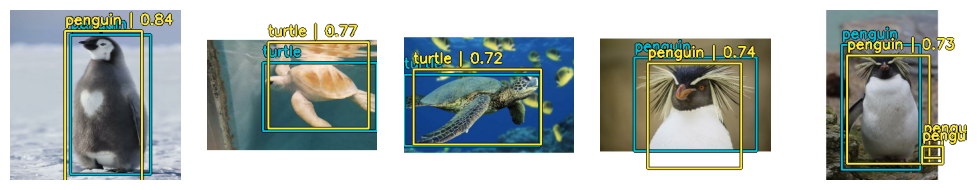

62/62 [==============================] - 26s 415ms/step - loss: 0.4013 - box_loss: 0.2217 - classification_loss: 0.1795 - percent_boxes_matched_with_anchor: 0.0000e+00 - val_loss: 0.7241 - val_box_loss: 0.3377 - val_classification_loss: 0.3863 - val_percent_boxes_matched_with_anchor: 0.0000e+00 - MaP: 0.1991 - MaP@[IoU=50]: 0.5429 - MaP@[IoU=75]: 0.0866 - MaP@[area=small]: 0.0000e+00 - MaP@[area=medium]: 0.3082 - MaP@[area=large]: 0.3648 - Recall@[max_detections=1]: 0.4097 - Recall@[max_detections=10]: 0.4097 - Recall@[max_detections=100]: 0.4097 - Recall@[area=small]: 0.0000e+00 - Recall@[area=medium]: 0.3819 - Recall@[area=large]: 0.4209 - lr: 5.0000e-04
Epoch 16/20
62/62 [==============================] - ETA: 0s - loss: 0.3888 - box_loss: 0.2140 - classification_loss: 0.1748 - percent_boxes_matched_with_anchor: 0.0000e+00

Valid: 100%|##########| 9/9 [00:07<00:00,  1.21it/s]


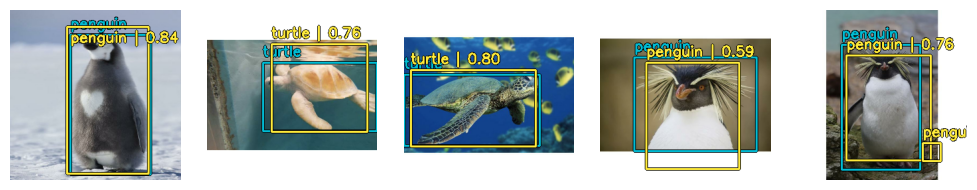

62/62 [==============================] - 26s 414ms/step - loss: 0.3888 - box_loss: 0.2140 - classification_loss: 0.1748 - percent_boxes_matched_with_anchor: 0.0000e+00 - val_loss: 1.0336 - val_box_loss: 0.3348 - val_classification_loss: 0.6989 - val_percent_boxes_matched_with_anchor: 0.0000e+00 - MaP: 0.1889 - MaP@[IoU=50]: 0.5242 - MaP@[IoU=75]: 0.0605 - MaP@[area=small]: 0.0000e+00 - MaP@[area=medium]: 0.3365 - MaP@[area=large]: 0.3503 - Recall@[max_detections=1]: 0.4100 - Recall@[max_detections=10]: 0.4100 - Recall@[max_detections=100]: 0.4100 - Recall@[area=small]: 0.0000e+00 - Recall@[area=medium]: 0.4056 - Recall@[area=large]: 0.4116 - lr: 5.0000e-04
Epoch 17/20
62/62 [==============================] - ETA: 0s - loss: 0.3710 - box_loss: 0.2040 - classification_loss: 0.1670 - percent_boxes_matched_with_anchor: 0.0000e+00

Valid: 100%|##########| 9/9 [00:07<00:00,  1.21it/s]


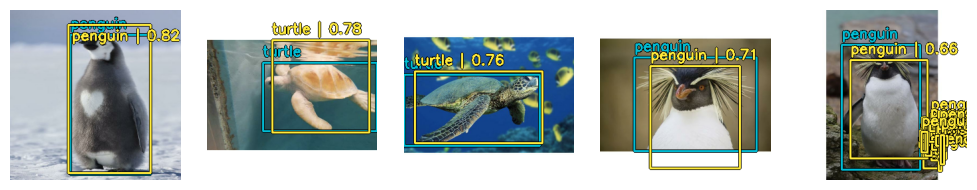

62/62 [==============================] - 26s 416ms/step - loss: 0.3710 - box_loss: 0.2040 - classification_loss: 0.1670 - percent_boxes_matched_with_anchor: 0.0000e+00 - val_loss: 0.8918 - val_box_loss: 0.3335 - val_classification_loss: 0.5583 - val_percent_boxes_matched_with_anchor: 0.0000e+00 - MaP: 0.2064 - MaP@[IoU=50]: 0.5378 - MaP@[IoU=75]: 0.0825 - MaP@[area=small]: 0.0000e+00 - MaP@[area=medium]: 0.3301 - MaP@[area=large]: 0.3646 - Recall@[max_detections=1]: 0.4155 - Recall@[max_detections=10]: 0.4155 - Recall@[max_detections=100]: 0.4232 - Recall@[area=small]: 0.0000e+00 - Recall@[area=medium]: 0.4278 - Recall@[area=large]: 0.4227 - lr: 5.0000e-04
Epoch 18/20
62/62 [==============================] - ETA: 0s - loss: 0.3613 - box_loss: 0.1977 - classification_loss: 0.1636 - percent_boxes_matched_with_anchor: 0.0000e+00

Valid: 100%|##########| 9/9 [00:07<00:00,  1.21it/s]


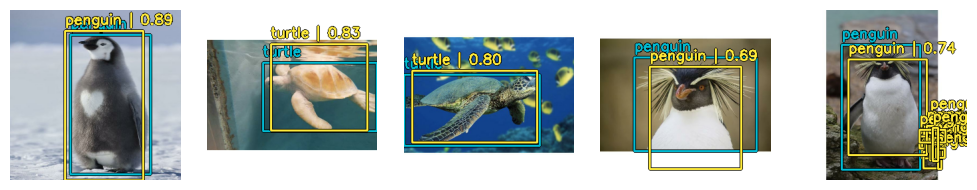

62/62 [==============================] - 26s 412ms/step - loss: 0.3613 - box_loss: 0.1977 - classification_loss: 0.1636 - percent_boxes_matched_with_anchor: 0.0000e+00 - val_loss: 0.7671 - val_box_loss: 0.3244 - val_classification_loss: 0.4428 - val_percent_boxes_matched_with_anchor: 0.0000e+00 - MaP: 0.2050 - MaP@[IoU=50]: 0.5520 - MaP@[IoU=75]: 0.0613 - MaP@[area=small]: 0.0000e+00 - MaP@[area=medium]: 0.3106 - MaP@[area=large]: 0.3591 - Recall@[max_detections=1]: 0.3979 - Recall@[max_detections=10]: 0.4044 - Recall@[max_detections=100]: 0.4044 - Recall@[area=small]: 0.0000e+00 - Recall@[area=medium]: 0.3714 - Recall@[area=large]: 0.4154 - lr: 5.0000e-04
Epoch 19/20
62/62 [==============================] - ETA: 0s - loss: 0.3486 - box_loss: 0.1905 - classification_loss: 0.1581 - percent_boxes_matched_with_anchor: 0.0000e+00

Valid: 100%|##########| 9/9 [00:07<00:00,  1.20it/s]


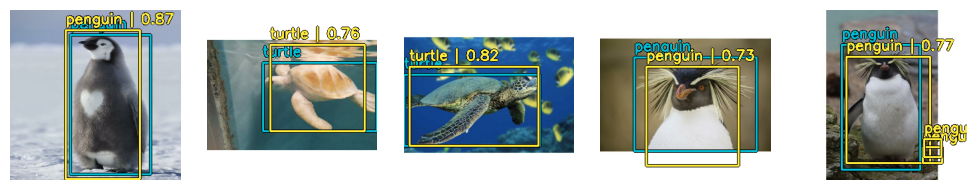

62/62 [==============================] - 26s 416ms/step - loss: 0.3486 - box_loss: 0.1905 - classification_loss: 0.1581 - percent_boxes_matched_with_anchor: 0.0000e+00 - val_loss: 0.6491 - val_box_loss: 0.3240 - val_classification_loss: 0.3251 - val_percent_boxes_matched_with_anchor: 0.0000e+00 - MaP: 0.2021 - MaP@[IoU=50]: 0.5719 - MaP@[IoU=75]: 0.0788 - MaP@[area=small]: 0.0000e+00 - MaP@[area=medium]: 0.2910 - MaP@[area=large]: 0.3553 - Recall@[max_detections=1]: 0.3860 - Recall@[max_detections=10]: 0.3860 - Recall@[max_detections=100]: 0.3947 - Recall@[area=small]: 0.0000e+00 - Recall@[area=medium]: 0.3670 - Recall@[area=large]: 0.4045 - lr: 5.0000e-04
Epoch 20/20
62/62 [==============================] - ETA: 0s - loss: 0.3388 - box_loss: 0.1855 - classification_loss: 0.1534 - percent_boxes_matched_with_anchor: 0.0000e+00

Valid: 100%|##########| 9/9 [00:07<00:00,  1.19it/s]


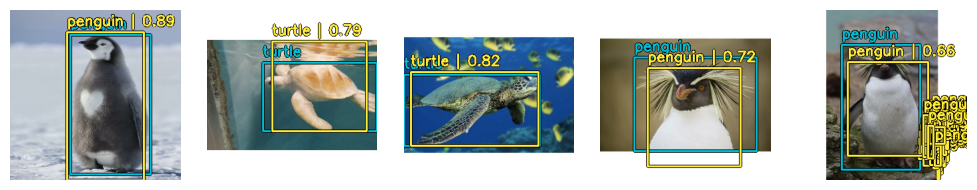

62/62 [==============================] - 26s 416ms/step - loss: 0.3388 - box_loss: 0.1855 - classification_loss: 0.1534 - percent_boxes_matched_with_anchor: 0.0000e+00 - val_loss: 1.0262 - val_box_loss: 0.3189 - val_classification_loss: 0.7073 - val_percent_boxes_matched_with_anchor: 0.0000e+00 - MaP: 0.1917 - MaP@[IoU=50]: 0.5190 - MaP@[IoU=75]: 0.0940 - MaP@[area=small]: 0.0000e+00 - MaP@[area=medium]: 0.3321 - MaP@[area=large]: 0.3530 - Recall@[max_detections=1]: 0.4161 - Recall@[max_detections=10]: 0.4161 - Recall@[max_detections=100]: 0.4210 - Recall@[area=small]: 0.0000e+00 - Recall@[area=medium]: 0.4187 - Recall@[area=large]: 0.4217 - lr: 5.0000e-04


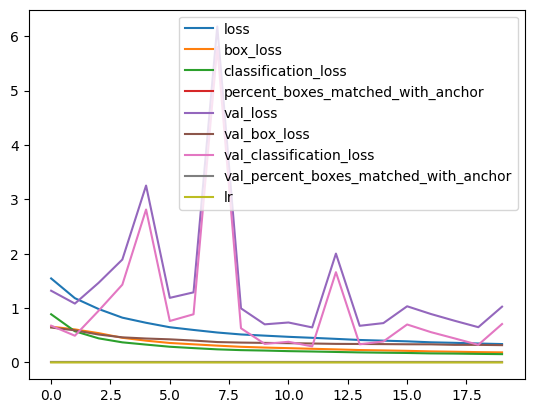

In [11]:
training('resnet50', callbacks=callbacks)